In [3]:
import math
import anuga

In [4]:
import math
import anuga


# Setup the domain
domain = anuga.rectangular_cross_domain(10,5)

# Set the initial conditions
domain.set_quantity('elevation', function = lambda x,y : x/10)
domain.set_quantity('stage', expression = "elevation + 0.2" )

# Define the boundary conditions
Br = anuga.Reflective_boundary(domain)
domain.set_boundary({'left' : Br, 'right' : Br, 'top' : Br, 'bottom' : Br})

# Specify the operators
rain = anuga.Rate_operator(domain, rate=lambda t: math.exp( -t**2 ), factor=0.001)

# Evolve the model
for t in domain.evolve(yieldstep=1.0, finaltime=10.0):
    domain.print_timestepping_statistics()

Setting omp_num_threads to 1
Time = 0.0000 (sec), steps=0 (0s)
Time = 1.0000 (sec), delta t in [0.00858488, 0.01071429] (s), steps=111 (0s)
Time = 2.0000 (sec), delta t in [0.00832106, 0.00991988] (s), steps=111 (0s)
Time = 3.0000 (sec), delta t in [0.00900245, 0.00991667] (s), steps=106 (0s)
Time = 4.0000 (sec), delta t in [0.00862595, 0.00962196] (s), steps=109 (0s)
Time = 5.0000 (sec), delta t in [0.00885777, 0.00988816] (s), steps=107 (0s)
Time = 6.0000 (sec), delta t in [0.00926474, 0.00986530] (s), steps=105 (0s)
Time = 7.0000 (sec), delta t in [0.00903161, 0.00969116] (s), steps=107 (0s)
Time = 8.0000 (sec), delta t in [0.00915208, 0.00983972] (s), steps=106 (0s)
Time = 9.0000 (sec), delta t in [0.00924040, 0.00982541] (s), steps=105 (0s)
Time = 10.0000 (sec), delta t in [0.00930656, 0.00972225] (s), steps=106 (0s)


In [13]:
import numpy as np
from pathlib import Path
import anuga

# Domain and mesh configuration
nx = ny = 110
length = width = 1100.0  # meters
# Domain CRS: define the coordinate system for your domain grid
# Examples: 'EPSG:32632' (UTM 32N), 'EPSG:28356' (MGA56), None if DEM already in meters
domain_crs = None  # Set to your project CRS (e.g., 'EPSG:32632') or None
domain_origin = (0.0, 0.0)  # (easting, northing) of domain's (0,0) in domain CRS

domain = anuga.rectangular_cross_domain(nx, ny, len1=length, len2=width)
domain.set_name('overland_flow_110x110')
domain.set_datadir('outputs')
domain.set_flow_algorithm('DE0')

# Load elevation from GeoTIFF DEM or fall back to CSV/synthetic
data_dir = Path('data')
data_dir.mkdir(parents=True, exist_ok=True)
dem_tif = Path('output_hh.tif')  # Your DEM file
elevation_path = data_dir / 'elevation_110x110.csv'
xs = np.linspace(0.0, length, nx + 1)
ys = np.linspace(0.0, width, ny + 1)
X, Y = np.meshgrid(xs, ys)

def sample_geotiff_simple(path, X, Y):
    """Sample GeoTIFF at X,Y coordinates (assumes same CRS/units as domain)"""
    try:
        import rasterio
        pts = [(float(x), float(y)) for x, y in zip(X.ravel(), Y.ravel())]
        with rasterio.open(path) as src:
            vals = np.fromiter((v[0] for v in src.sample(pts)), dtype=float)
            nodata = src.nodata
            if nodata is not None:
                vals[vals == nodata] = 0.0
        return vals.reshape(X.shape)
    except ImportError:
        from osgeo import gdal
        ds = gdal.Open(str(path))
        band = ds.GetRasterBand(1).ReadAsArray().astype(float)
        gt = ds.GetGeoTransform()
        originX, pixelW, rotX, originY, rotY, pixelH = gt
        ny_r, nx_r = band.shape
        xi = (X - originX) / pixelW
        yi = (Y - originY) / pixelH
        ix0 = np.clip(np.floor(xi).astype(int), 0, nx_r - 1)
        iy0 = np.clip(np.floor(yi).astype(int), 0, ny_r - 1)
        ix1 = np.clip(ix0 + 1, 0, nx_r - 1)
        iy1 = np.clip(iy0 + 1, 0, ny_r - 1)
        wx = xi - ix0
        wy = yi - iy0
        z00 = band[iy0, ix0]
        z10 = band[iy1, ix0]
        z01 = band[iy0, ix1]
        z11 = band[iy1, ix1]
        return (1.0 - wy) * ((1.0 - wx) * z00 + wx * z01) + wy * ((1.0 - wx) * z10 + wx * z11)

if dem_tif.exists():
    try:
        elevation_grid = sample_geotiff_simple(dem_tif, X, Y)
        print(f'Loaded DEM from {dem_tif}')
    except Exception as e:
        raise RuntimeError(f'Failed to load DEM from {dem_tif}: {e}')
elif elevation_path.exists():
    elevation_grid = np.loadtxt(elevation_path, delimiter=',')
    print(f'Loaded elevation from {elevation_path}')
else:
    elevation_grid = 0.5 * np.sin(2 * np.pi * X / length)
    elevation_grid += 0.25 * np.cos(2 * np.pi * Y / width)
    elevation_grid += 0.001 * (Y / width)
    np.savetxt(elevation_path, elevation_grid, delimiter=',', fmt='%.6f')
    print(f'Generated synthetic DEM, saved to {elevation_path}')

expected_shape = (ny + 1, nx + 1)
if elevation_grid.shape != expected_shape:
    raise ValueError(f'Expected elevation grid shape {expected_shape}, got {elevation_grid.shape}')

class BilinearElevation:
    def __init__(self, grid, length, width):
        self.grid = grid
        self.ny, self.nx = grid.shape
        self.length = length

        self.width = width    print(f'Rainfall rate at t={t:.1f}s: {rainfall_rate(t):.6e} m/s')

    domain.print_timestepping_statistics()

    def __call__(self, x, y):for t in domain.evolve(yieldstep=yieldstep, finaltime=finaltime):

        ax = np.asarray(x, dtype=float)

        ay = np.asarray(y, dtype=float)finaltime = 10800.0

        ix = np.clip(ax / self.length * (self.nx - 1), 0.0, self.nx - 1)yieldstep = 60.0

        iy = np.clip(ay / self.width * (self.ny - 1), 0.0, self.ny - 1)

        i0 = np.floor(iy).astype(int)domain.set_boundary({'left': boundary, 'right': boundary, 'top': boundary, 'bottom': boundary})

        j0 = np.floor(ix).astype(int)boundary = anuga.Reflective_boundary(domain)

        i1 = np.clip(i0 + 1, 0, self.ny - 1)

        j1 = np.clip(j0 + 1, 0, self.nx - 1)rain_operator = anuga.Rate_operator(domain, rate=rainfall_rate, factor=1.0)

        wy = iy - i0

        wx = ix - j0    return 0.0

        g = self.grid            return event['intensity_mm_hr'] / 1000.0 / 3600.0

        z00 = g[i0, j0]        if event['start'] <= t < event['end']:

        z10 = g[i1, j0]    for event in rain_events:

        z01 = g[i0, j1]def rainfall_rate(t):

        z11 = g[i1, j1]

        return (1.0 - wy) * ((1.0 - wx) * z00 + wx * z01) + wy * ((1.0 - wx) * z10 + wx * z11)]

    {'start': 7200.0, 'end': 9000.0, 'intensity_mm_hr': 2.0},

elevation_fn = BilinearElevation(elevation_grid, length, width)    {'start': 3600.0, 'end': 5400.0, 'intensity_mm_hr': 15.0},

domain.set_quantity('elevation', elevation_fn)    {'start': 0.0, 'end': 1800.0, 'intensity_mm_hr': 5.0},

domain.set_quantity('stage', lambda x, y: elevation_fn(x, y) + 0.001)rain_events = [

domain.set_quantity('friction', 0.03)

SyntaxError: unmatched ']' (2699770892.py, line 121)

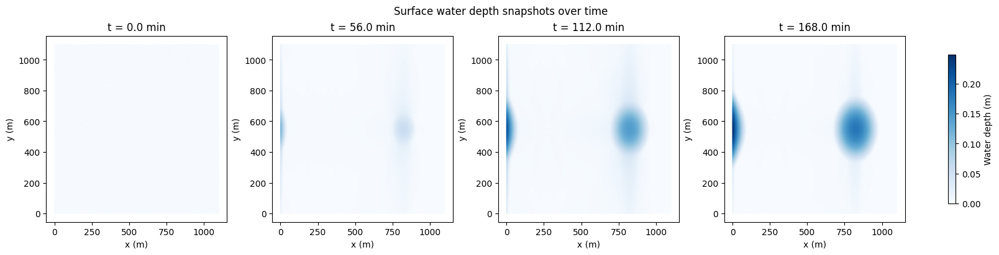

Animation saved to outputs\overland_flow_depth.gif


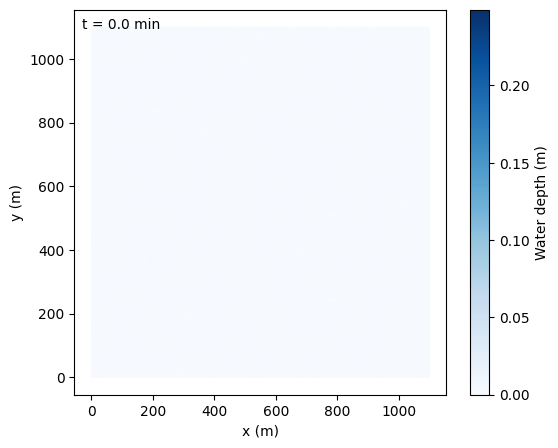

In [14]:
import netCDF4
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.tri import Triangulation
from matplotlib import animation
from pathlib import Path
from IPython.display import HTML

# Load ANUGA simulation output (.sww file, NOT the .tif DEM)
sww_path = Path('outputs') / 'overland_flow_110x110.sww'
if not sww_path.exists():
    raise FileNotFoundError(f'Run cell 3 first to generate {sww_path}')

with netCDF4.Dataset(sww_path) as ds:
    time = ds.variables['time'][:].copy()
    x = ds.variables['x'][:].copy()
    y = ds.variables['y'][:].copy()
    stage = ds.variables['stage'][:].copy()  # shape (nt, npoints)
    if 'elevation' in ds.variables:
        bed = ds.variables['elevation'][:].copy()
    elif 'bed_elevation' in ds.variables:
        bed = ds.variables['bed_elevation'][:].copy()
    else:
        raise KeyError('Could not find bed elevation in the SWW file.')
    volumes = ds.variables['volumes'][:].astype(int)

tri = Triangulation(x, y, volumes)
depth = np.maximum(stage - bed, 0.0)
max_depth = depth.max()
time_minutes = time / 60.0

# Snapshot plot at four representative timesteps
snapshot_indices = np.linspace(0, len(time) - 1, num=4, dtype=int)
fig, axes = plt.subplots(1, len(snapshot_indices), figsize=(16, 4), constrained_layout=True)
quad = None
for ax, idx in zip(axes, snapshot_indices):
    quad = ax.tripcolor(tri, depth[idx], shading='gouraud', cmap='Blues', vmin=0.0, vmax=max_depth)
    ax.set_title(f't = {time_minutes[idx]:.1f} min')
    ax.set_xlabel('x (m)')
    ax.set_ylabel('y (m)')
fig.colorbar(quad, ax=axes.ravel().tolist(), shrink=0.8, label='Water depth (m)')
fig.suptitle('Surface water depth snapshots over time')
plt.show()

# Animation showing the full temporal evolution (display inline and optionally save)
fig_anim, ax_anim = plt.subplots(figsize=(6, 5))
pcm = ax_anim.tripcolor(tri, depth[0], shading='gouraud', cmap='Blues', vmin=0.0, vmax=max_depth)
ax_anim.set_xlabel('x (m)')
ax_anim.set_ylabel('y (m)')
time_text = ax_anim.text(0.02, 0.95, f't = {time_minutes[0]:.1f} min', transform=ax_anim.transAxes, color='k')
fig_anim.colorbar(pcm, ax=ax_anim, label='Water depth (m)')

def update(frame_idx):
    pcm.set_array(depth[frame_idx])
    time_text.set_text(f't = {time_minutes[frame_idx]:.1f} min')
    return pcm, time_text

anim = animation.FuncAnimation(fig_anim, update, frames=len(time), interval=150, blit=False)
display(HTML(anim.to_jshtml()))

gif_path = Path('outputs') / 'overland_flow_depth.gif'
try:
    anim.save(gif_path, writer='pillow', fps=10)
    print(f'Animation saved to {gif_path}')
except Exception as exc:
    print(f'Skipped GIF export ({exc}). Use pip install pillow if needed.')

In [2]:
# requirements: anuga (installed), rasterio, numpy
import numpy as np
import rasterio
from rasterio.warp import calculate_default_transform, reproject, Resampling
import anuga

# ---------- 1) open DEM and (optionally) reproject to a projected CRS ----------
dem_path = "output_hh.tif"

with rasterio.open(dem_path) as src:
    dem = src.read(1)                 # 2D array (rows, cols)
    dem_transform = src.transform
    dem_crs = src.crs
    nodata = src.nodata
    bounds = src.bounds               # left, bottom, right, top

# If your DEM is in geographic coords (EPSG:4326 lat/lon), consider reprojecting
# ANUGA works best with projected (meter) units. Simple reprojection example below:
target_crs = 'EPSG:32643'  # example UTM zone - pick one appropriate for your ROI
if dem_crs is None or dem_crs.to_string().startswith('EPSG:4326'):
    # compute transform / shape for reprojection
    with rasterio.open(dem_path) as src:
        transform, width, height = calculate_default_transform(
            src.crs, target_crs, src.width, src.height, *src.bounds)
        kwargs = src.meta.copy()
        kwargs.update({
            'crs': target_crs,
            'transform': transform,
            'width': width,
            'height': height
        })

        reprojected_dem = np.empty((height, width), dtype=src.dtypes[0])
        reproject(
            source=rasterio.band(src, 1),
            destination=reprojected_dem,
            src_transform=src.transform,
            src_crs=src.crs,
            dst_transform=transform,
            dst_crs=target_crs,
            resampling=Resampling.bilinear
        )
    # overwrite variables with reprojected version
    dem = reprojected_dem
    dem_transform = transform
    dem_crs = rasterio.crs.CRS.from_string(target_crs)
    left, bottom, right, top = rasterio.transform.array_bounds(height, width, transform)
else:
    left, bottom, right, top = bounds.left, bounds.bottom, bounds.right, bounds.top

# ---------- 2) build an ANUGA domain that covers the DEM extent ----------
# Option A: quick rectangular domain (easy)
# Choose number of divisions (nx, ny) depending on desired mesh resolution.
nx = 100          # number of cells along x (tune this)
ny = 100          # number of cells along y (tune this)
width_m = right - left
height_m = top - bottom

# Create rectangular domain. The routine creates a triangulation of the rectangle.
domain = anuga.rectangular_cross_domain(nx, ny, len1=width_m, len2=height_m)
domain.set_name('dem_runoff_domain')

# SHIFT domain coordinates to DEM location:
# ANUGA's rectangular_cross_domain creates a domain whose lower-left is (0,0).
# We add the DEM lower-left (left, bottom) as an offset via georeference:
domain.set_georeference({'xllcorner': left, 'yllcorner': bottom, 'projection': dem_crs.to_string()})

# ---------- 3) compute triangle centroids (absolute coordinates) ----------
centroids = domain.get_centroid_coordinates(absolute=True)   # returns Nx2 array [x,y]

# ---------- 4) sample DEM at centroids ----------
# Use rasterio to sample. Open DEM again (or reuse above file if not reprojected).
with rasterio.open(dem_path) as src:
    # if you reprojected earlier, open the reprojected raster instead
    if src.crs is None or src.crs.to_string().startswith('EPSG:4326'):
        # if you reprojected above, write the reprojected DEM to a temp file and open it;
        # for brevity this snippet assumes dem and dem_transform are the final arrays you want,
        # and will use manual coordinate->row/col mapping below.
        pass

# simpler: convert centroids to DEM row/col indices using the affine transform:
from rasterio.transform import rowcol
elev_values = []
n_bad = 0
for x, y in centroids:
    try:
        r, c = rowcol(dem_transform, x, y)   # row, col in raster indexing
        # bounds check
        if 0 <= r < dem.shape[0] and 0 <= c < dem.shape[1]:
            val = dem[r, c]
            if val == nodata:
                elev_values.append(np.nan)
                n_bad += 1
            else:
                elev_values.append(float(val))
        else:
            elev_values.append(np.nan)
            n_bad += 1
    except Exception:
        elev_values.append(np.nan)
        n_bad += 1

elev_values = np.array(elev_values)

# Optional: fill NaNs by interpolation (scipy.interpolate.griddata) or nearest neighbour
# e.g., replace NaNs with nearest neighbour sample (quick fix)
import scipy
from scipy import ndimage
# simple nearest-neighbour fill:
mask = np.isnan(elev_values)
if np.any(mask):
    # replace NaN with mean of non-NaN (very quick fallback). Consider better interpolation.
    elev_values[mask] = np.nanmean(elev_values)

# ---------- 5) set elevation in ANUGA domain ----------
domain.set_quantity('elevation', elev_values, location='centroids')

# Done — domain now has elevation set from your DEM centroids.
print("Domain created with", domain.number_of_triangles, "triangles. NaN/invalid samples:", n_bad)


Setting omp_num_threads to 1


AttributeError: 'dict' object has no attribute 'is_absolute'